<a href="https://colab.research.google.com/github/woooon79/GAN/blob/main/DCGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')  

Mounted at /content/drive/


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

from torchvision import datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchvision.transforms.functional import to_pil_image
import matplotlib.pylab as plt
%matplotlib inline

import os
import numpy as np
import time
import random

from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

manualSeed=999

random.seed(manualSeed)
torch.manual_seed(manualSeed)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
batch_size=128

image_size=64

num_epochs=5

beta1=0.5

nc=3

nz=100

lr=0.0002

# Dataset

구글 드라이브에 저장한 img_align_celeba.zip 파일 불러오기

In [ ]:
os.makedirs('/content/data/celeba',exist_ok=True)

In [ ]:
zip_path = os.path.join('/content/drive/MyDrive/img_align_celeba.zip')
unzip_path = os.path.join('/content/data/celeba')
file_name = "img_align_celeba.zip"


!cp "{zip_path}" "{unzip_path}"
!unzip "/content/data/celeba/img_align_celeba" -d "/content/data/celeba/"
!rm -r '/content/img_align_celeba'

데이터셋과 데이터로더 설정

In [ ]:

dataroot='/content/data/celeba/'
dataset=datasets.ImageFolder(root=dataroot,
                             transform=transforms.Compose([
                                                           transforms.Resize(image_size),
                                                           transforms.CenterCrop(image_size),
                                                           transforms.ToTensor(),
                                                           transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))
                             ])
                             )

dataloader=torch.utils.data.DataLoader(dataset,batch_size=batch_size,shuffle=True,num_workers=2)



샘플 이미지들 확인

In [ ]:
# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

#Model


generator : training 데이터와 유사한 가짜이미지를 만든다.

discriminator : 실제데이터인지 generator로 부터 생성된 가짜 이미지인지 판별

In [ ]:
class Generator(nn.Module):
  def __init__(self):
    super(Generator,self).__init__()
    self.main=nn.Sequential(
        nn.ConvTranspose2d(100,512,kernel_size=4,stride=1,padding=0,bias=False),
        nn.BatchNorm2d(512),
        nn.ReLU(inplace=True),
        
        nn.ConvTranspose2d(512,256,4,2,1,bias=False),
        nn.BatchNorm2d(256),
        nn.ReLU(inplace=True),

        nn.ConvTranspose2d(256,128,4,2,1,bias=False),
        nn.BatchNorm2d(128),
        nn.ReLU(inplace=True),

        nn.ConvTranspose2d(128,64,4,2,1,bias=False),
        nn.BatchNorm2d(64),
        nn.ReLU(inplace=True),


        nn.ConvTranspose2d(64,3,4,2,1,bias=False),
        nn.Tanh()
    )

  def forward(self,input):
    return self.main(input)

In [ ]:
class Discriminator(nn.Module):
  def __init__(self):
    super(Discriminator,self).__init__()
    self.main=nn.Sequential(
        nn.Conv2d(3,64,4,2,1,bias=False),
        nn.LeakyReLU(0.2,inplace=True),

        nn.Conv2d(64,128,4,2,1,bias=False),
        nn.BatchNorm2d(128),
        nn.LeakyReLU(0.2,inplace=True),

        nn.Conv2d(128,256,4,2,1,bias=False),
        nn.BatchNorm2d(256),
        nn.LeakyReLU(0.2,inplace=True),

        nn.Conv2d(256,512,4,2,1,bias=False),
        nn.BatchNorm2d(512),
        nn.LeakyReLU(0.2,inplace=True),

        nn.Conv2d(512,1,4,1,0,bias=False),
        nn.Sigmoid()
    )

  def forward(self,input):
    return self.main(input)

In [ ]:
# 가중치 초기화
def initialize_weights(model):
    classname = model.__class__.__name__
    # conv layer
    if classname.find('Conv') != -1:
        nn.init.normal_(model.weight.data, 0.0, 0.02)
    # batchnorm
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(model.weight.data, 1.0, 0.02)
        nn.init.constant_(model.bias.data, 0)




In [ ]:
model_g=Generator().to(device)
model_d=Discriminator().to(device)

model_g.apply(initialize_weights)
model_d.apply(initialize_weights)


Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

# Train

In [ ]:
#손실함수는 binary cross entropy 사용
criterion=nn.BCELoss()

fixed_noise=torch.randn(64,100,1,1,device=device)

real_label=1
fake_label=0

optimizer_g=optim.Adam(model_g.parameters(),lr=lr,betas=(beta1,0.999))
optimizer_d=optim.Adam(model_d.parameters(),lr=lr,betas=(beta1,0.999))

In [ ]:
img_list=[]
losses_g=[]
losses_d=[]
iters=0

print("Starting Training Loop,,,")

for epoch in range(num_epochs):
  for i,data in enumerate(dataloader):

    ###############Discriminator 모델 업데이트##############
    #왜 optimizer.zero_grad()가 아니라 nn.module.zero_grad()를 썼을까
    #https://aigong.tistory.com/187 참고
    #여기서는 같은것으로 봐도 무방
    #하나의 optimizer에 여러개 모델 적용하거나 그 반대의 경우에 구분해서 사용
    model_d.zero_grad()
    #이미지
    real_cpu=data[0].to(device)
    #배치사이즈 128로 고정안하는이유 => 데이터로더 마지막 배치사이즈가 103이거등요
    b_size=real_cpu.size(0)

    label=torch.full((b_size,),real_label,dtype=torch.float,device=device)


    #실제 이미지-discriminator loss
    output=model_d(real_cpu).view(-1)
    errD_real=criterion(output,label)
    errD_real.backward()
    D_x=output.mean().item()

    
    noise=torch.randn(b_size,nz,1,1,device=device)#가짜 벡터 생성
    fake=model_g(noise) #가짜이미지 생성
    label.fill_(fake_label)

    #fake 본인의 requires_grad를 false로만든다
    #errD_fake.backward()가 되어도 fake의 grad는 false

    #우리가 학습할려는 건 model_d의 파라미터들이기때문에 weight tensor만 requires_grad가 true면됨
    #fake의 requires_grad가 false이므로 backpropagation해도 model_g에 영향안미침=> model_g에 backpropagation이 안된다

    #실제 이미지-discriminator loss
    output=model_d(fake.detach()).view(-1)  #detach 하는 이유??? => model_d만 학습하려는 의도로 fake.detach() / model_g는 학습이 안되도록
    errD_fake=criterion(output,label)
    errD_fake.backward()
    D_G_z1=output.mean().item()

    #errD는 discrimitor의 가짜이미지 판별 loss값 + 진짜이미지 판별 loss값 
    errD=errD_real+errD_fake 
    optimizer_d.step()



    ###############Generator 모델 업데이트##############
    model_g.zero_grad()
    label.fill_(real_label)

    #generator가 생성하는게 가짜이미지니까 가짜만 계산하면돼

    output=model_d(fake).view(-1) #가짜이미지 discriminator 
    errG=criterion(output,label) #가짜이미지 판별값 와 진짜라벨 loss 
    errG.backward()

    D_G_z2=output.mean().item()
    optimizer_g.step()


    if i %50==0:
      print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
            %(epoch,num_epochs,i,len(dataloader),errD.item(),errG.item(),D_x,D_G_z1,D_G_z2))
    
    losses_g.append(errG.item())
    losses_d.append(errD.item())

    if (iters % 500==0) or ((epoch==num_epochs-1) and (i==len(dataloader)-1)):
      with torch.no_grad():
        fake=model_g(fixed_noise).detach().cpu()
      img_list.append(vutils.make_grid(fake, padding=2, normalize=True))


            
    iters += 1


    



#Results

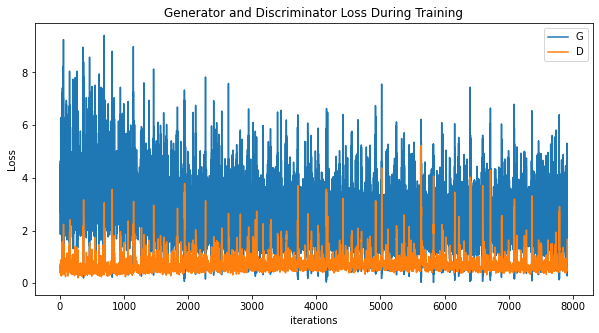

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(losses_g,label="G")
plt.plot(losses_d,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

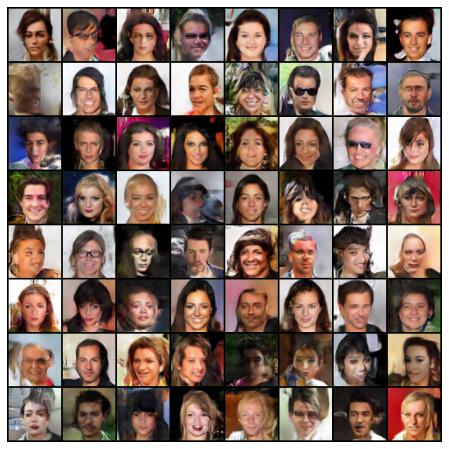

In [ ]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

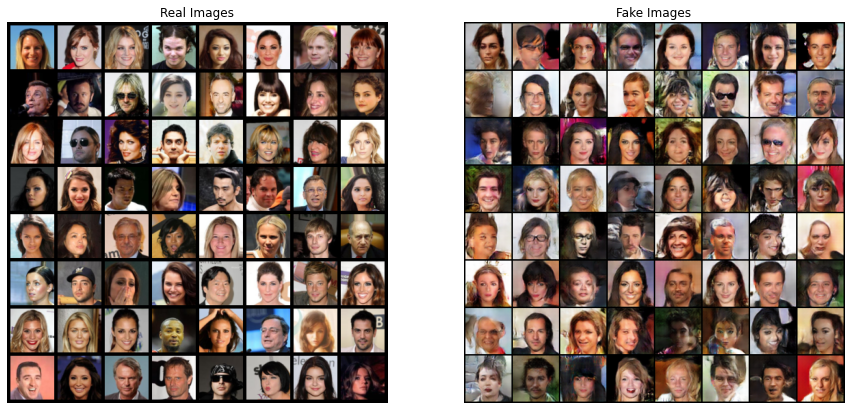

In [ ]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()